In [1]:
pip install opencv-python

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 25.1.1 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


In [2]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# Erosion:
* all pixels under kernel shld be 1 to keep it
# Dilation 
* atleast one pixel under kernel shld be 1 to keep it
# syntax:
* cv2.erode(src, kernel, dst=None, anchor=None, iterations=1, borderType=None, borderValue=None)
* border type: CONSTANT, REPLICATE, TRANSPERANT
* borderValue is used in case of a constant border. By default, it is 0


In [9]:
img = cv.imread('LinuxLogo.jpg',0)
kernel = np.ones((5,5),np.uint8)
erosion = cv.erode(img,kernel,iterations = 1)
dilation = cv.dilate(img,kernel,iterations = 1)
cv.imshow('Original', img)
cv.imshow('Erosion', erosion)
cv.imshow('Dialation', dilation)

cv.waitKey(0)
cv.destroyAllWindows()

# Contours:



COMPLETE CONTOUR ANALYSIS: RETRIEVAL MODES + APPROXIMATION METHODS

RETR_EXTERNAL + CHAIN_APPROX_NONE:
  Contours found: 1
  Total points stored: 1980
  Example - First contour points: 1980

RETR_LIST + CHAIN_APPROX_NONE:
  Contours found: 24
  Total points stored: 25168
  Example - First contour points: 140

RETR_CCOMP + CHAIN_APPROX_NONE:
  Contours found: 24
  Total points stored: 25168
  Example - First contour points: 144

RETR_TREE + CHAIN_APPROX_NONE:
  Contours found: 24
  Total points stored: 25168
  Example - First contour points: 1980

RETR_EXTERNAL + CHAIN_APPROX_SIMPLE:
  Contours found: 1
  Total points stored: 984
  Example - First contour points: 984

RETR_LIST + CHAIN_APPROX_SIMPLE:
  Contours found: 24
  Total points stored: 12400
  Example - First contour points: 56

RETR_CCOMP + CHAIN_APPROX_SIMPLE:
  Contours found: 24
  Total points stored: 12400
  Example - First contour points: 72

RETR_TREE + CHAIN_APPROX_SIMPLE:
  Contours found: 24
  Total points stored: 124

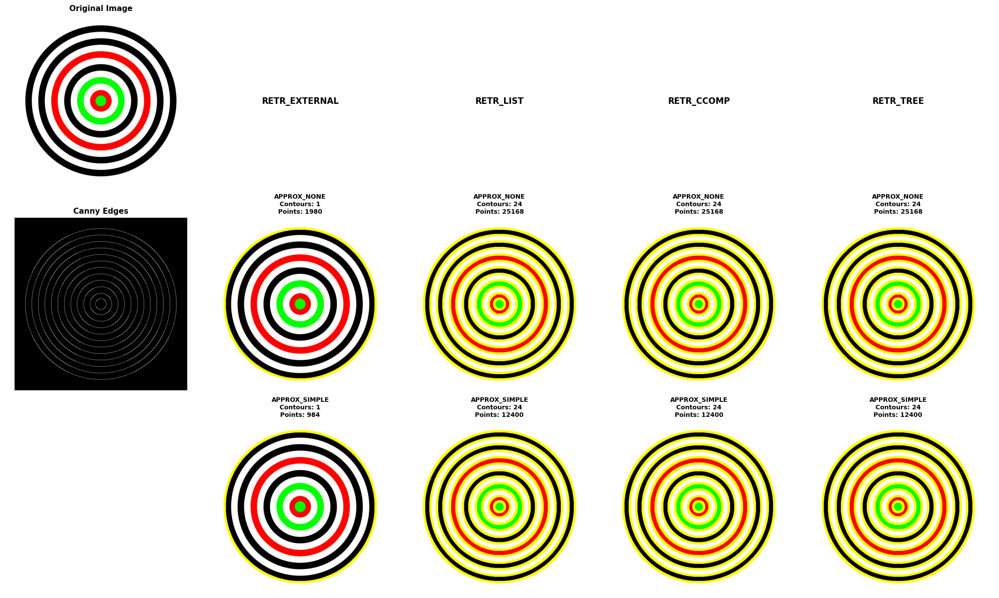

Result saved as 'complete_contour_comparison.png'

KEY OBSERVATIONS:

1. RETRIEVAL MODES:
   - EXTERNAL: Only outer boundaries
   - LIST: All contours, flat structure
   - CCOMP: 2-level (outer + holes)
   - TREE: Full nested hierarchy

2. APPROXIMATION METHODS:
   - NONE: Stores every pixel (more points)
   - SIMPLE: Only endpoints (fewer points, same shape)

3. RECOMMENDATION:
   - Use RETR_EXTERNAL + CHAIN_APPROX_SIMPLE for most tasks
   - Use RETR_TREE when you need nested relationships
   - Use CHAIN_APPROX_NONE only when exact pixel accuracy is needed


In [6]:
# Read the image
img = cv.imread('dartboard.png')

if img is None:
    print("Error: Could not load image. Check the file path.")
    exit()

# Convert to grayscale
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

# Apply Canny edge detection
canny = cv.Canny(gray, 30, 200)

print("\n" + "=" * 80)
print("COMPLETE CONTOUR ANALYSIS: RETRIEVAL MODES + APPROXIMATION METHODS")
print("=" * 80)

# Define retrieval modes
retrieval_modes = [
    (cv.RETR_EXTERNAL, "EXTERNAL"),
    (cv.RETR_LIST, "LIST"),
    (cv.RETR_CCOMP, "CCOMP"),
    (cv.RETR_TREE, "TREE")
]

# Define approximation methods
approx_methods = [
    (cv.CHAIN_APPROX_NONE, "NONE"),
    (cv.CHAIN_APPROX_SIMPLE, "SIMPLE")
]

# Create figure with subplots
fig, axes = plt.subplots(len(approx_methods) + 1, len(retrieval_modes) + 1, 
                         figsize=(20, 12))

# Show original and canny in first column
axes[0, 0].imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
axes[0, 0].set_title('Original Image', fontsize=11, fontweight='bold')
axes[0, 0].axis('off')

axes[1, 0].imshow(canny, cmap='gray')
axes[1, 0].set_title('Canny Edges', fontsize=11, fontweight='bold')
axes[1, 0].axis('off')

axes[2, 0].axis('off')  # Empty cell

# Header row - show retrieval mode names
for col_idx, (_, mode_name) in enumerate(retrieval_modes):
    axes[0, col_idx + 1].text(0.5, 0.5, f'RETR_{mode_name}', 
                              ha='center', va='center',
                              fontsize=12, fontweight='bold',
                              transform=axes[0, col_idx + 1].transAxes)
    axes[0, col_idx + 1].axis('off')

# Process each combination
for row_idx, (approx_method, approx_name) in enumerate(approx_methods):
    for col_idx, (retrieval_mode, mode_name) in enumerate(retrieval_modes):
        # Create a copy of the original image
        img_copy = img.copy()
        
        # Find contours
        contours, hierarchy = cv.findContours(canny, retrieval_mode, approx_method)
        
        # Draw contours
        cv.drawContours(img_copy, contours, -1, (0,255,255), 10)
        
        # Calculate total points
        total_points = sum(len(c) for c in contours)
        
        # Display
        axes[row_idx + 1, col_idx + 1].imshow(cv.cvtColor(img_copy, cv.COLOR_BGR2RGB))
        axes[row_idx + 1, col_idx + 1].set_title(
            f'APPROX_{approx_name}\n'
            f'Contours: {len(contours)}\n'
            f'Points: {total_points}',
            fontsize=9, fontweight='bold'
        )
        axes[row_idx + 1, col_idx + 1].axis('off')
        
        # Print information
        print(f"\nRETR_{mode_name} + CHAIN_APPROX_{approx_name}:")
        print(f"  Contours found: {len(contours)}")
        print(f"  Total points stored: {total_points}")
        if len(contours) > 0:
            print(f"  Example - First contour points: {len(contours[0])}")

print("\n" + "=" * 80)

plt.tight_layout()
plt.savefig('complete_contour_comparison.png', dpi=150, bbox_inches='tight')
plt.show()

print("Result saved as 'complete_contour_comparison.png'")
print("=" * 80)

# Additional analysis
print("\n" + "=" * 80)
print("KEY OBSERVATIONS:")
print("=" * 80)
print("\n1. RETRIEVAL MODES:")
print("   - EXTERNAL: Only outer boundaries")
print("   - LIST: All contours, flat structure")
print("   - CCOMP: 2-level (outer + holes)")
print("   - TREE: Full nested hierarchy")

print("\n2. APPROXIMATION METHODS:")
print("   - NONE: Stores every pixel (more points)")
print("   - SIMPLE: Only endpoints (fewer points, same shape)")

print("\n3. RECOMMENDATION:")
print("   - Use RETR_EXTERNAL + CHAIN_APPROX_SIMPLE for most tasks")
print("   - Use RETR_TREE when you need nested relationships")
print("   - Use CHAIN_APPROX_NONE only when exact pixel accuracy is needed")
print("=" * 80)

# Template Matching
* **TM_CCORR**: Multiplies pixels together - like checking if two colors are exactly the same shade
* **TM_CCORR_NORMED**: Same as CCORR but gives a 0-100% similarity score
* **TM_CCOEFF**: Recognizes patterns regardless of brightness - like identifying a song at any volume
* **TM_CCOEFF_NORMED**: ⭐ Best method - like face recognition that works in any lighting (gives -1 to +1 score)
* **TM_SQDIFF**: Counts pixel differences - like grading a test by counting wrong answers (lower = better)
* **TM_SQDIFF_NORMED**: Same as SQDIFF but gives a 0-100% error score (0% = perfect match)

In [ ]:
img = cv.imread('rubberwhale.png',1)
cv.imshow('Original',img)
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

template = cv.imread('whale.png',0)
cv.imshow('Template',template)
w,h = template.shape[0], template.shape[1]

matched = cv.matchTemplate(gray,template,cv.TM_CCOEFF_NORMED)
threshold = 0.8

loc = np.where( matched >= threshold)

for pt in zip(*loc[::-1]):
   cv.rectangle(img, pt, (pt[0] + w, pt[1] + h), (0,255,255), 2)

cv.imshow('Matched with Template',img)


cv.waitKey(0)
cv.destroyAllWindows()

## Image Pyramids - Summary

### What Are Image Pyramids?
* Multi-scale representation of an image - stack of progressively smaller/larger versions
* Used for multi-scale processing, faster computation, and image blending

### Gaussian Pyramid (pyrDown - Downsampling)
* **Process**: Blur with Gaussian kernel → Remove every other row/column
* **Result**: Image becomes 1/4 the area (half width × half height)
* **Purpose**: Make image smaller while avoiding aliasing artifacts

### Laplacian Pyramid (pyrUp - Upsampling)
* **Process**: Insert zeros between pixels → Convolve with Gaussian to fill gaps
* **Result**: Image becomes 4× the area (double width × double height)
* **Purpose**: Make image larger by estimating missing pixels

### Key Concept: Information Loss ⚠️
* **Downsampling is LOSSY** - throws away 75% of pixels and fine details
* **Upsampling cannot recover** lost information - only estimates/guesses
* **Formula**: `Original → pyrDown → pyrUp ≠ Original`
* After down then up: same size, but lower quality (blurry, less detail)
* Like summarizing a book then trying to rewrite it - you can't recreate exact details

### Real-World Analogy
* **pyrDown**: Taking a photo, then deleting 75% of pixels - detail is permanently gone
* **pyrUp**: Trying to "zoom in" on a low-res photo - just makes it bigger and blurrier
* **Result**

IMAGE PYRAMID - Starry Night
Instructions:
  Type 'i' and press Enter - Zoom IN
  Type 'o' and press Enter - Zoom OUT
  Type 'q' and press Enter - Quit


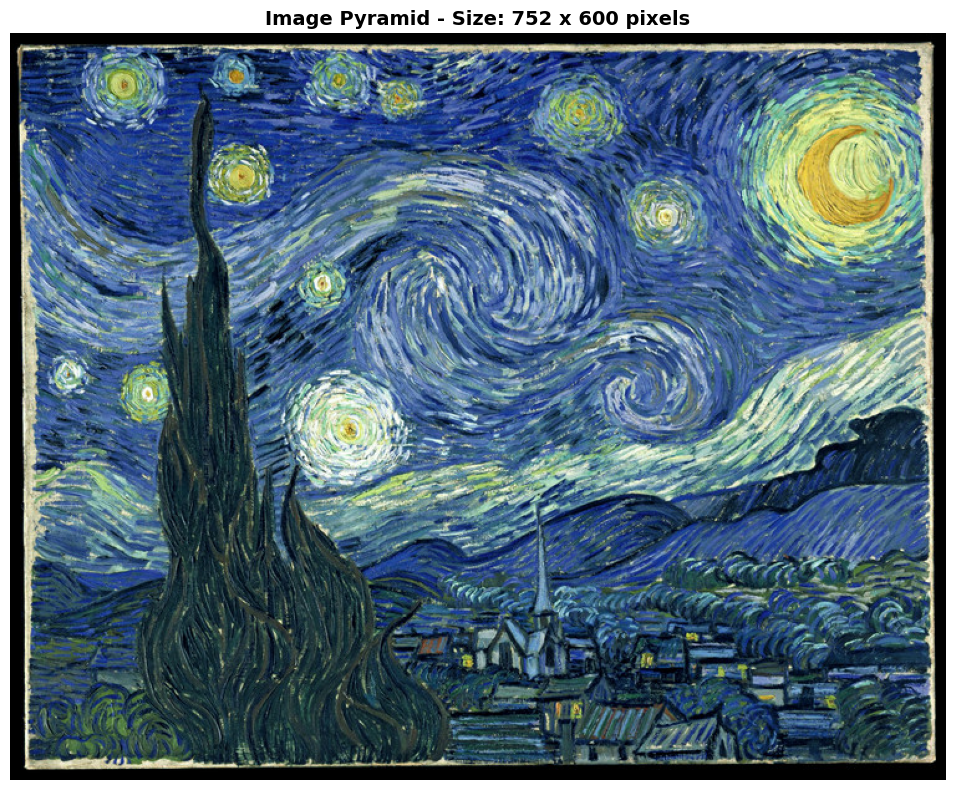


Current size: 752 x 600


Enter command (i/o/q):  i


✓ Zoomed IN to 1504x1200


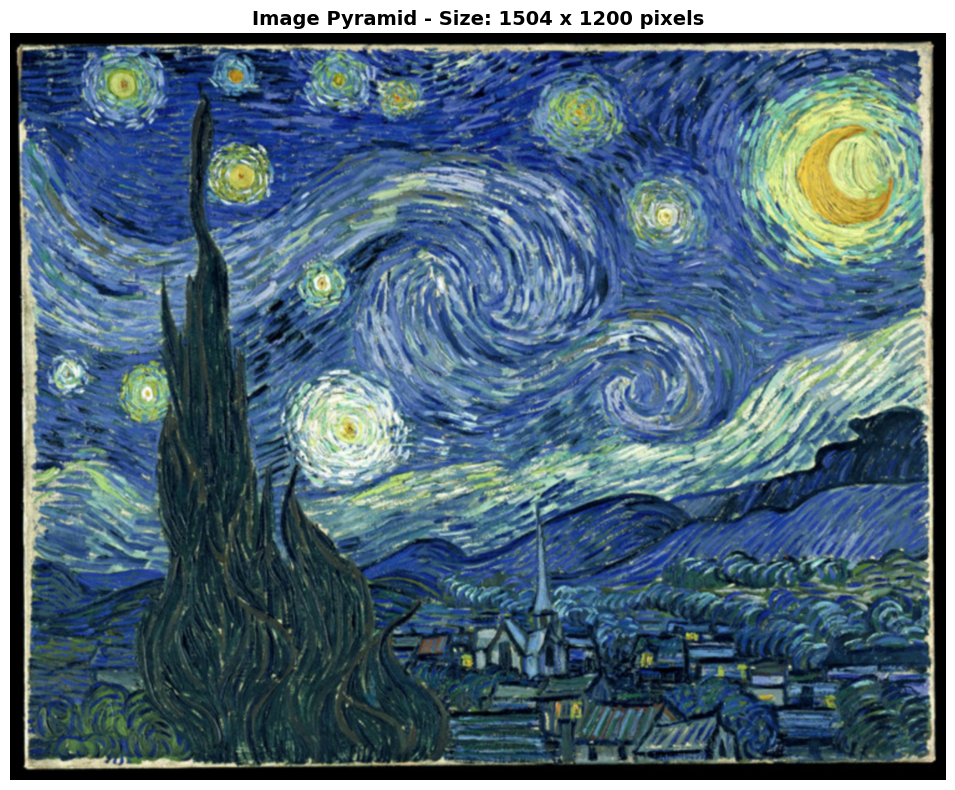


Current size: 1504 x 1200


Enter command (i/o/q):  o


✓ Zoomed OUT to 752x600


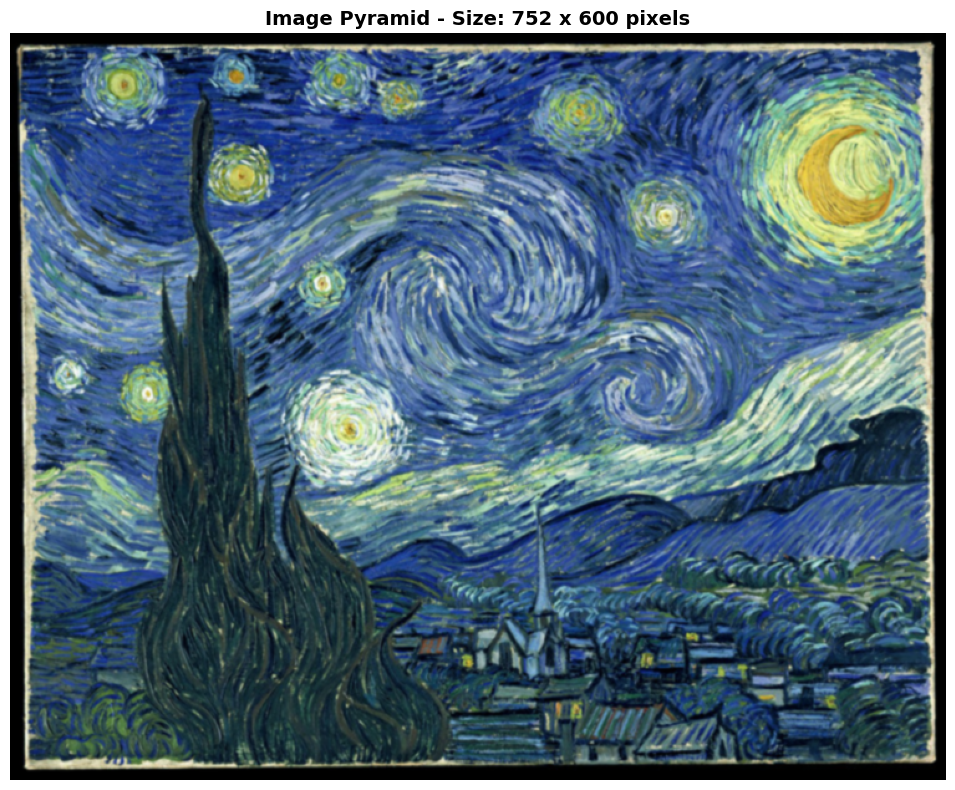


Current size: 752 x 600


Enter command (i/o/q):  o


✓ Zoomed OUT to 376x300


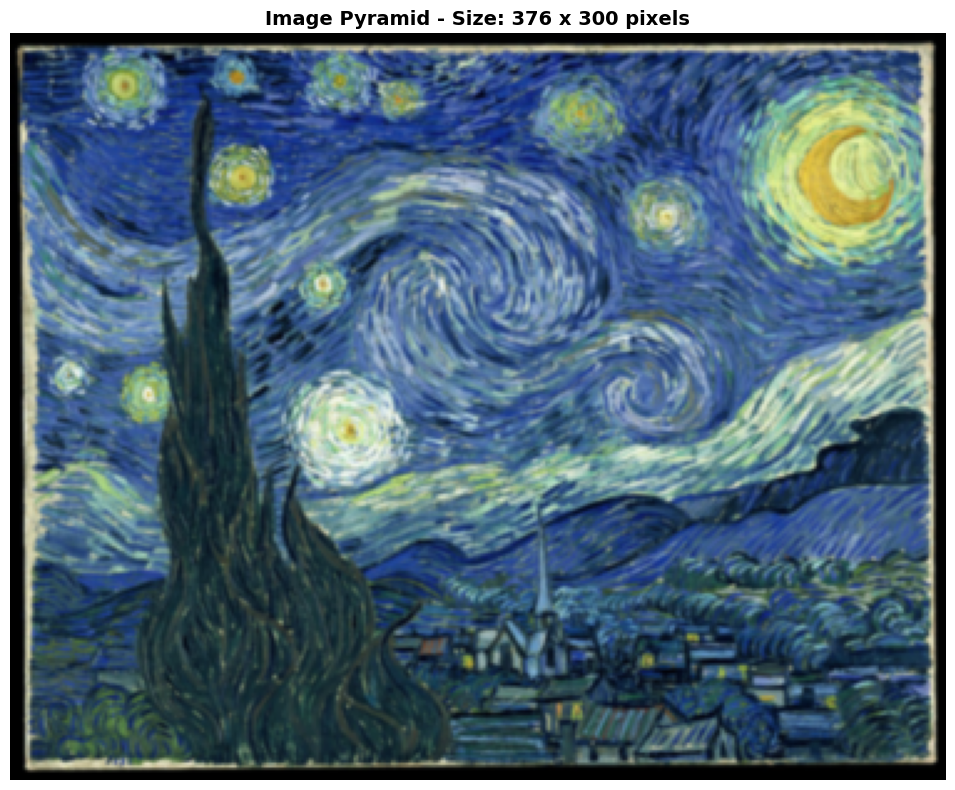


Current size: 376 x 300


Enter command (i/o/q):  o


✓ Zoomed OUT to 188x150


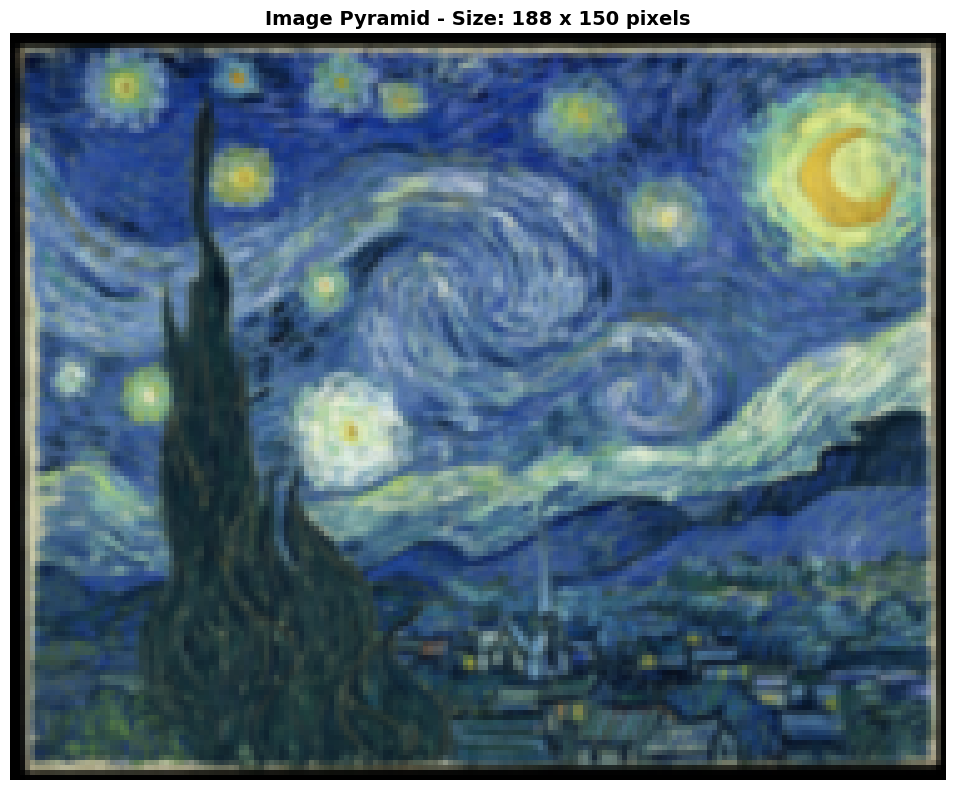


Current size: 188 x 150


Enter command (i/o/q):  o


✓ Zoomed OUT to 94x75


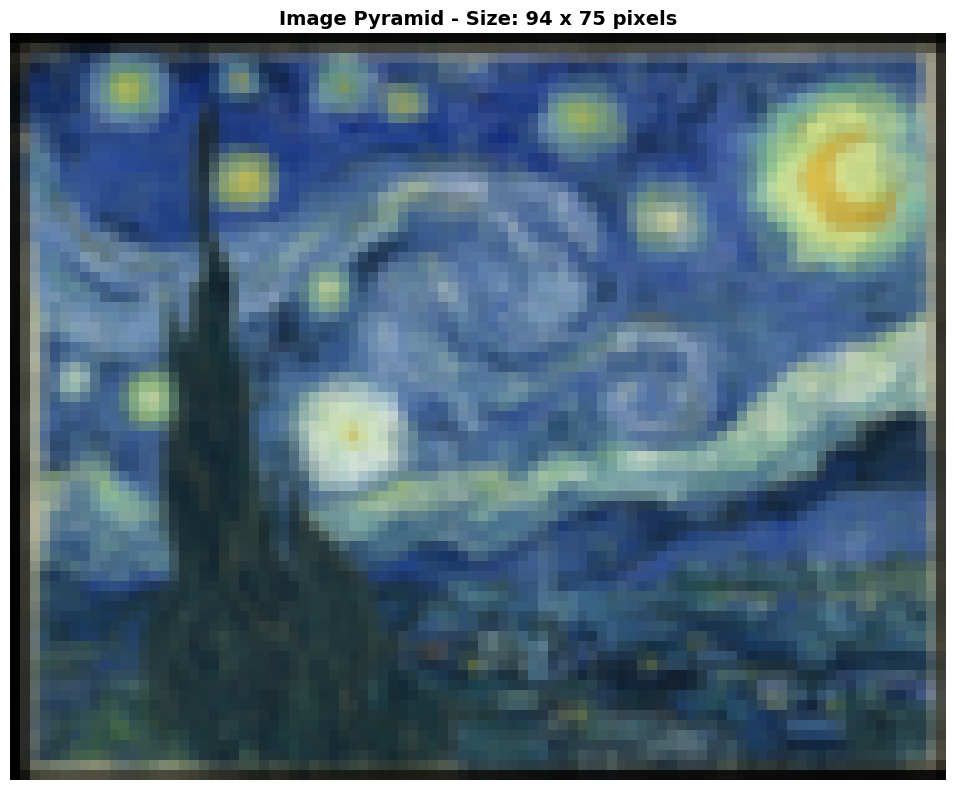


Current size: 94 x 75


Enter command (i/o/q):  i


✓ Zoomed IN to 188x150


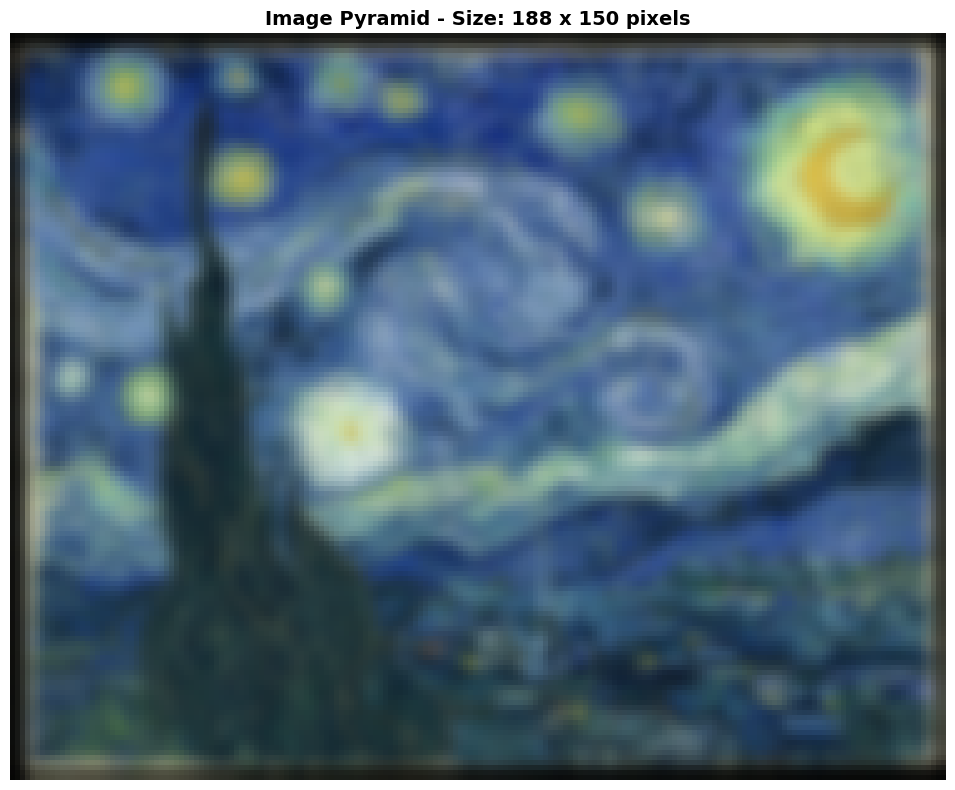


Current size: 188 x 150


Enter command (i/o/q):  i


✓ Zoomed IN to 376x300


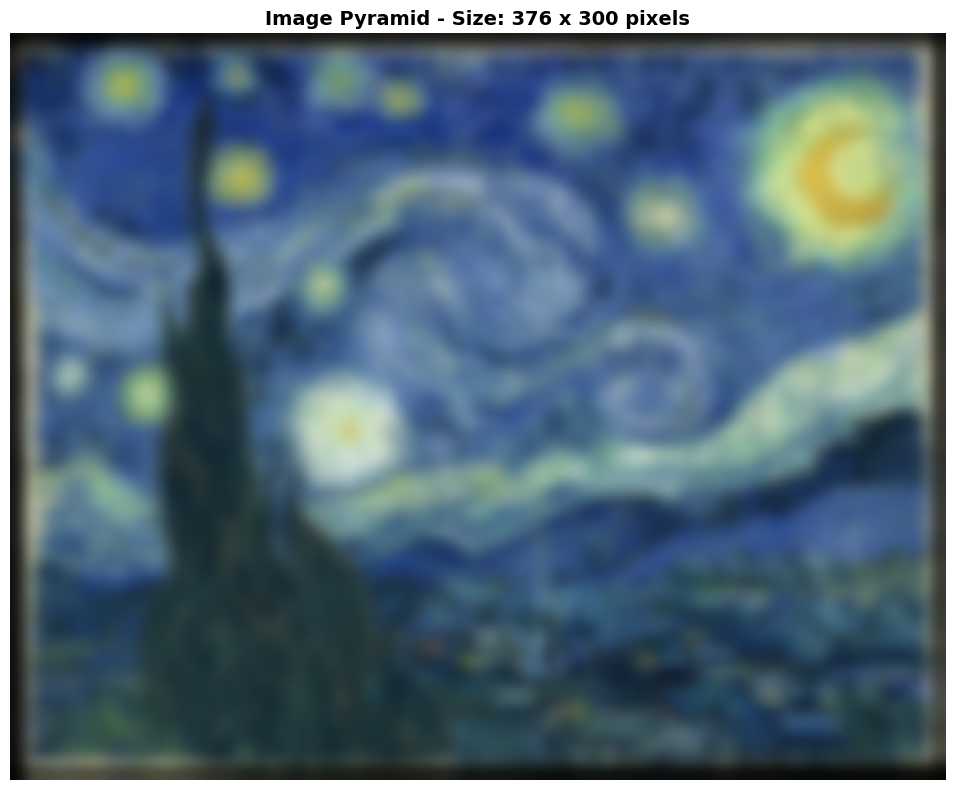


Current size: 376 x 300


Enter command (i/o/q):  i


✓ Zoomed IN to 752x600


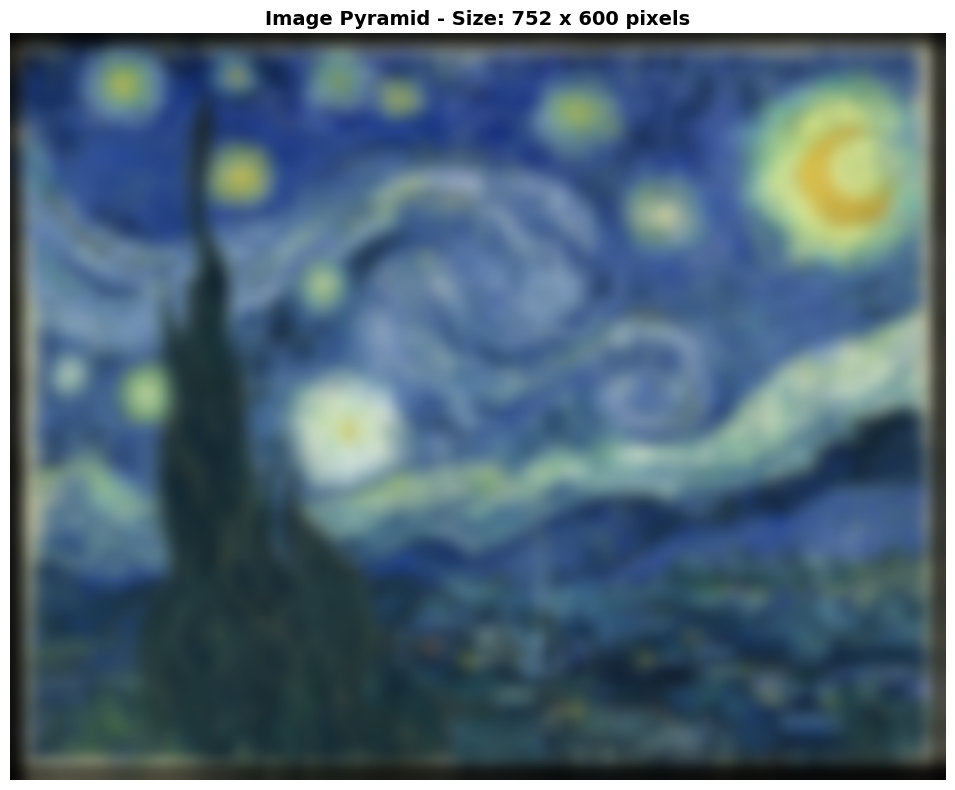


Current size: 752 x 600


Enter command (i/o/q):  i


✓ Zoomed IN to 1504x1200


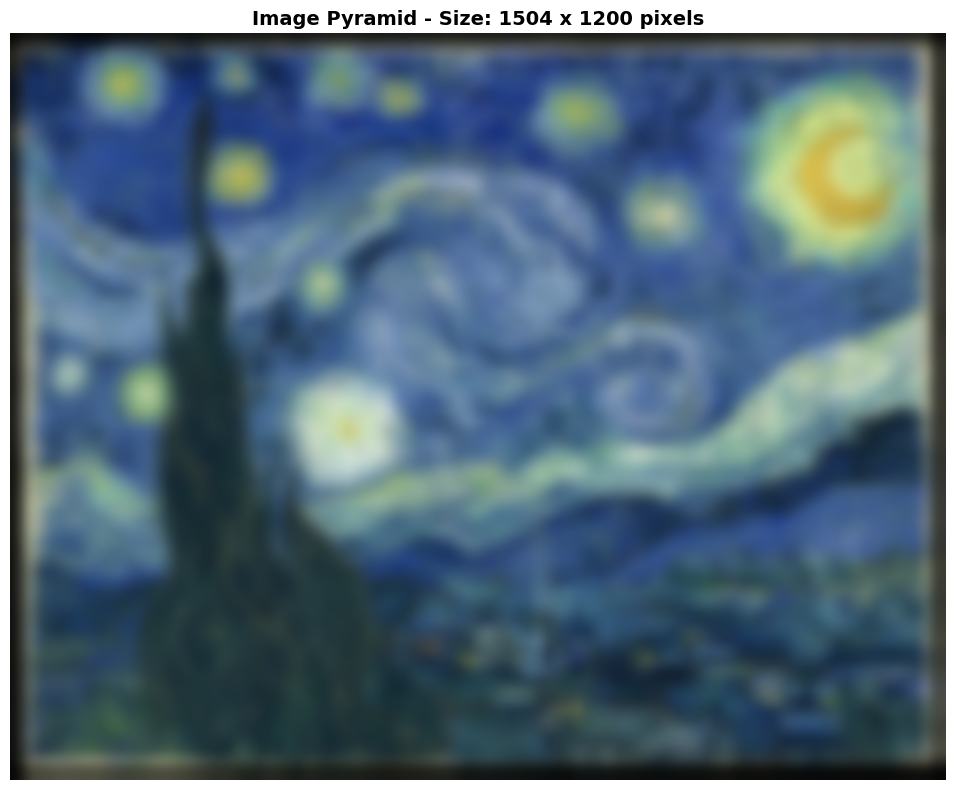


Current size: 1504 x 1200


Enter command (i/o/q):  i


✓ Zoomed IN to 3008x2400


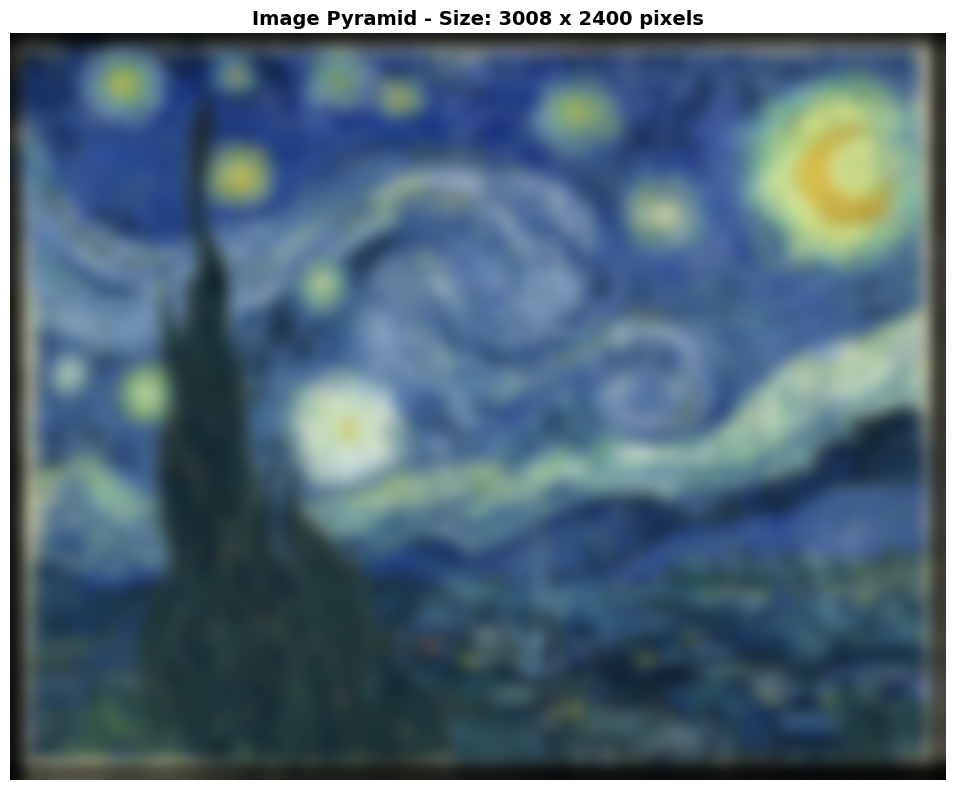


Current size: 3008 x 2400


Enter command (i/o/q):  i


✓ Zoomed IN to 6016x4800


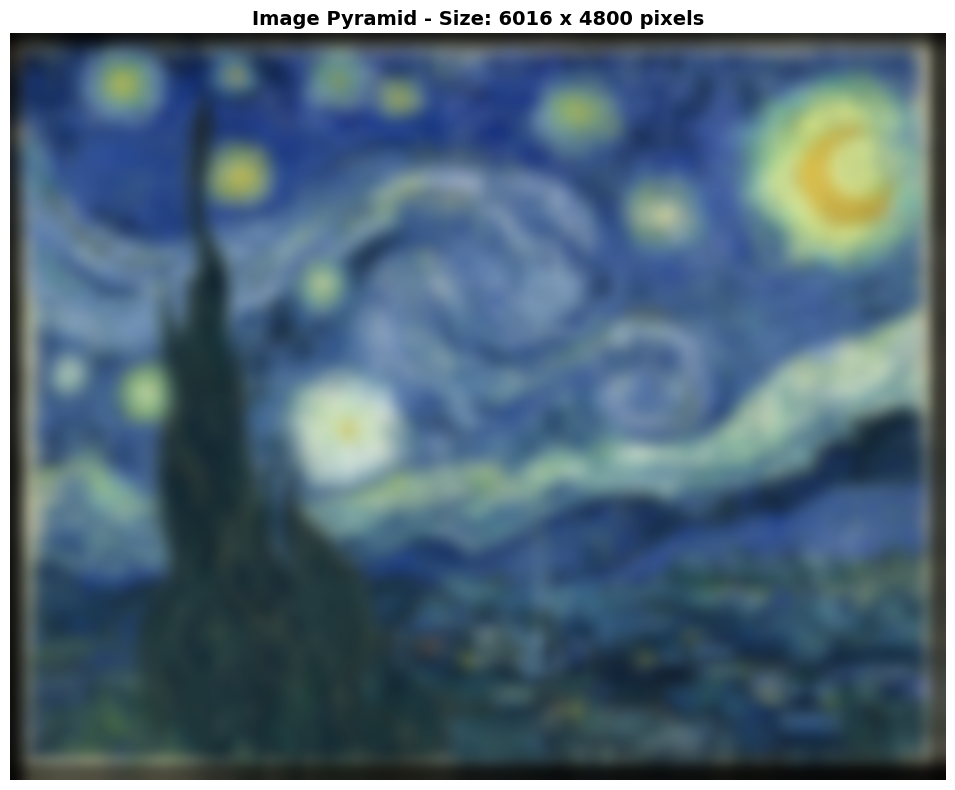


Current size: 6016 x 4800


KeyboardInterrupt: Interrupted by user

Enter command (i/o/q):  q


In [9]:
# Load image
src = cv.imread('starry_night.jpg')
if src is None:
    print("Error: Image not found!")
    exit()

# Convert BGR to RGB for matplotlib
src = cv.cvtColor(src, cv.COLOR_BGR2RGB)

print("=" * 70)
print("IMAGE PYRAMID - Starry Night")
print("=" * 70)
print("Instructions:")
print("  Type 'i' and press Enter - Zoom IN")
print("  Type 'o' and press Enter - Zoom OUT")
print("  Type 'q' and press Enter - Quit")
print("=" * 70)

while True:
    rows, cols = src.shape[:2]
    
    # Display image
    plt.figure(figsize=(12, 8))
    plt.imshow(src)
    plt.title(f'Image Pyramid - Size: {cols} x {rows} pixels', 
              fontsize=14, fontweight='bold')
    plt.axis('off')
    plt.tight_layout()
    plt.show()
    
    # Get user input
    print(f"\nCurrent size: {cols} x {rows}")
    key = input("Enter command (i/o/q): ").lower().strip()
    
    if key == 'q':  # Quit
        print("Exiting...")
        break
    elif key == 'i':  # Zoom IN
        src = cv.pyrUp(src)
        print(f"✓ Zoomed IN to {src.shape[1]}x{src.shape[0]}")
    elif key == 'o':  # Zoom OUT
        src = cv.pyrDown(src)
        print(f"✓ Zoomed OUT to {src.shape[1]}x{src.shape[0]}")
    else:
        print("✗ Invalid input! Use 'i', 'o', or 'q'")

print("Program completed!")
print("=" * 70)

# Image Addition:

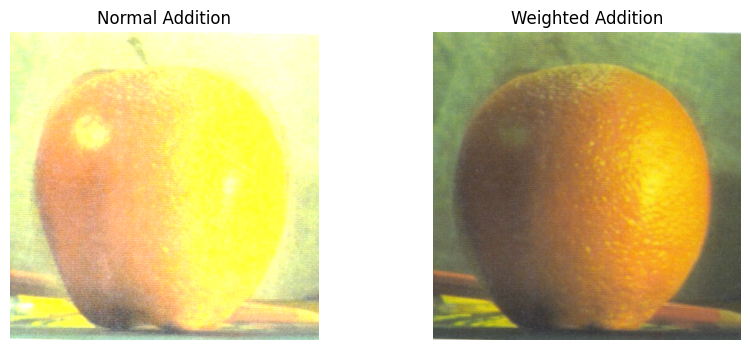

In [8]:


apple = cv.imread('apple.jpg')
orange = cv.imread('orange.jpg')

orange = cv.resize(orange, (apple.shape[1], apple.shape[0]))

normal_add = cv.add(apple, orange)
weighted_add = cv.addWeighted(apple, 0.2, orange, 0.8, 0)

# Convert BGR → RGB
normal_add = cv.cvtColor(normal_add, cv.COLOR_BGR2RGB)
weighted_add = cv.cvtColor(weighted_add, cv.COLOR_BGR2RGB)

plt.figure(figsize=(10,4))
plt.subplot(1,2,1)
plt.title("Normal Addition")
plt.imshow(normal_add)
plt.axis('off')

plt.subplot(1,2,2)
plt.title("Weighted Addition")
plt.imshow(weighted_add)
plt.axis('off')

plt.show()


# Image Blending

In [13]:

# -------------------------------
# 1. Read the two images
# -------------------------------
apple = cv.imread('apple.jpg')
orange = cv.imread('orange.jpg')

# Make sure both images are same size
orange = cv.resize(orange, (apple.shape[1], apple.shape[0]))

# -------------------------------
# 2. Generate Gaussian Pyramid for apple
# -------------------------------
G = apple.copy()
gp_apple = [G]

for i in range(6):
    G = cv.pyrDown(G)   # reduce resolution
    gp_apple.append(G)

# -------------------------------
# 3. Generate Gaussian Pyramid for orange
# -------------------------------
G = orange.copy()
gp_orange = [G]

for i in range(6):
    G = cv.pyrDown(G)
    gp_orange.append(G)

# -------------------------------
# 4. Generate Laplacian Pyramid for apple
# -------------------------------
lp_apple = [gp_apple[5]]  # smallest level

for i in range(5, 0, -1):
    GE = cv.pyrUp(gp_apple[i])          # expand
    L = cv.subtract(gp_apple[i-1], GE)  # difference
    lp_apple.append(L)

# -------------------------------
# 5. Generate Laplacian Pyramid for orange
# -------------------------------
lp_orange = [gp_orange[5]]

for i in range(5, 0, -1):
    GE = cv.pyrUp(gp_orange[i])
    L = cv.subtract(gp_orange[i-1], GE)
    lp_orange.append(L)

# -------------------------------
# 6. Blend each level (left apple + right orange)
# -------------------------------
LS = []

for la, lb in zip(lp_apple, lp_orange):
    rows, cols, dpt = la.shape

    # left half from apple, right half from orange
    ls = np.hstack((
        la[:, :cols//2],
        lb[:, cols//2:]
    ))
    LS.append(ls)

# -------------------------------
# 7. Reconstruct the final image
# -------------------------------
ls_ = LS[0]

for i in range(1, 6):
    ls_ = cv.pyrUp(ls_)
    ls_ = cv.add(ls_, LS[i])

# -------------------------------
# 8. Display result
# -------------------------------
cv.imshow('Apple-Orange Pyramid Blending', ls_)
cv.waitKey(0)
cv.destroyAllWindows()


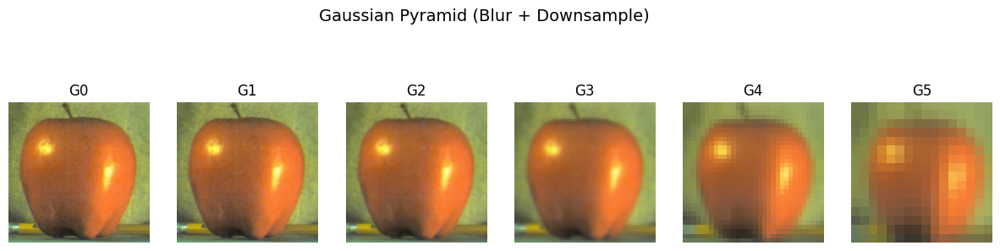

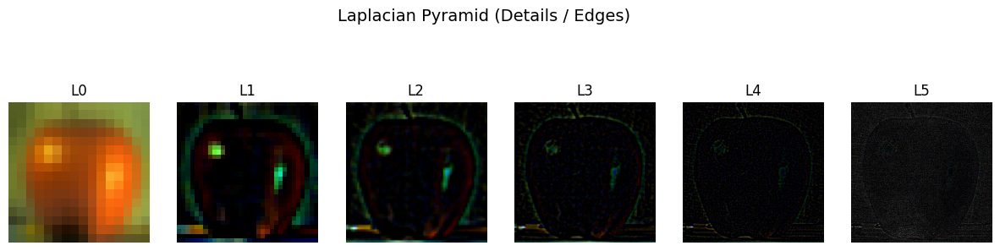

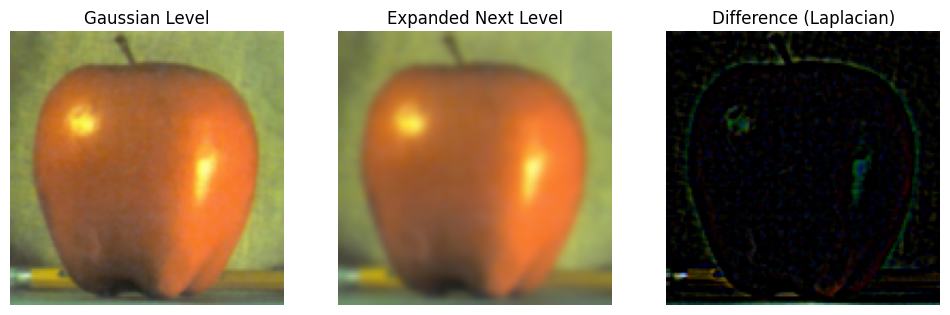

In [12]:
import cv2

apple = cv2.imread('apple.jpg')
apple = cv2.cvtColor(apple, cv2.COLOR_BGR2RGB)

# ---------- Gaussian Pyramid ----------
gp = [apple]
G = apple.copy()

for i in range(6):
    G = cv2.pyrDown(G)
    gp.append(G)

# ---------- Laplacian Pyramid ----------
lp = [gp[5]]

for i in range(5, 0, -1):
    GE = cv2.pyrUp(gp[i])
    L = cv2.subtract(gp[i-1], GE)
    lp.append(L)


# gaussian layers: gets blurry and more pixely
plt.figure(figsize=(15,4))
for i in range(6):
    plt.subplot(1,6,i+1)
    plt.imshow(gp[i])
    plt.title(f'G{i}')
    plt.axis('off')

plt.suptitle("Gaussian Pyramid (Blur + Downsample)", fontsize=14)
plt.show()

# laplace layers- what was lost at each gaussian layer
plt.figure(figsize=(15,4))
for i in range(6):
    plt.subplot(1,6,i+1)

    # Normalize for visibility (important!)
    lap = lp[i]
    lap_norm = cv2.normalize(lap, None, 0, 255, cv2.NORM_MINMAX)

    plt.imshow(lap_norm.astype(np.uint8))
    plt.title(f'L{i}')
    plt.axis('off')

plt.suptitle("Laplacian Pyramid (Details / Edges)", fontsize=14)
plt.show()

#difference 

i = 2  # pick any level

GE = cv2.pyrUp(gp[i+1])
diff = cv2.subtract(gp[i], GE)

plt.figure(figsize=(12,4))

plt.subplot(1,3,1)
plt.imshow(gp[i])
plt.title("Gaussian Level")
plt.axis('off')

plt.subplot(1,3,2)
plt.imshow(GE)
plt.title("Expanded Next Level")
plt.axis('off')

plt.subplot(1,3,3)
diff_norm = cv2.normalize(diff, None, 0, 255, cv2.NORM_MINMAX)
plt.imshow(diff_norm.astype(np.uint8))
plt.title("Difference (Laplacian)")
plt.axis('off')

plt.show()



# Fourier Transform:

- The Fourier Transform converts an image from the **spatial domain** to the **frequency domain**. (amplituve vs time -> freq&phase vs time)
- It represents an image as a sum of **sine and cosine** (sinusoidal) components.
- Digital images have discrete pixel values (usually **0–255**), so the **Discrete Fourier Transform (DFT)** is used.
- The 2D DFT decomposes an image into different **frequency components**.
- **Low-frequency components** represent smooth regions and gradual intensity variations.
- **High-frequency components** correspond to **edges, fine details, and noise**, where intensity changes rapidly.
- In images, edges cause sudden amplitude changes, resulting in high-frequency content.
- OpenCV provides `cv.dft()` to compute the DFT and `cv.idft()` to reconstruct the image.
- Fourier Transform is widely used in **filtering, denoising, edge detection, and image analysis**.
- IFT <-> FT: no loss of info


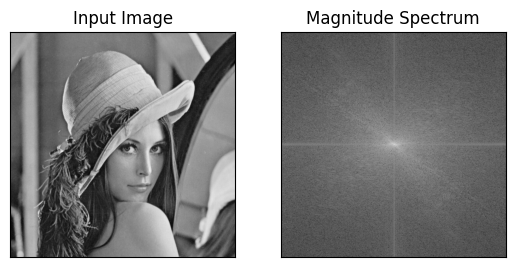

In [14]:
img = cv.imread('lena.jpg',0)
dft = cv.dft(np.float32(img),flags = cv.DFT_COMPLEX_OUTPUT)
dft_shift = np.fft.fftshift(dft)
magnitude_spectrum = 20*np.log(cv.magnitude(dft_shift[:,:,0],dft_shift[:,:,1]))
plt.subplot(121),plt.imshow(img, cmap = 'gray')
plt.title('Input Image'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(magnitude_spectrum, cmap = 'gray')
plt.title('Magnitude Spectrum'), plt.xticks([]), plt.yticks([])
plt.show()

# Capture Videos:


In [16]:
# --------------------------------------------------
# Open camera using VideoCapture()
# Device index 0 refers to the built-in webcam
# --------------------------------------------------
cam = cv.VideoCapture(0)

# Check if camera opened successfully
if not cam.isOpened():
    print("Error opening camera")
    exit()

# --------------------------------------------------
# Define video codec and create VideoWriter object
# --------------------------------------------------
# fourcc is a 4-character code for the codec
cc = cv.VideoWriter_fourcc(*'XVID')

# Create VideoWriter object to save the output video
file = cv.VideoWriter('output.avi', cc, 15.0, (640, 480))

# --------------------------------------------------
# Capture frames continuously from the camera
# --------------------------------------------------
while True:
    # Read the next frame from the camera
    ret, frame = cam.read()

    # ret is True if frame is read correctly
    if not ret:
        print("Error in retrieving frame")
        break

    # Convert frame from BGR to RGB color space
    img = cv.cvtColor(frame, cv.COLOR_BGR2RGB)

    # Display the resulting frame
    cv.imshow('Live Camera Feed', img)

    # Write the frame to the output video file
    file.write(frame)  # VideoWriter expects BGR format

    # Press 'q' to exit the loop
    if cv.waitKey(1) & 0xFF == ord('q'):
        break
# --------------------------------------------------
# Release camera and video writer objects
# --------------------------------------------------
cam.release()
file.release()
cv.destroyAllWindows()


In [18]:
!pip3 install ffpyplayer

   ---------------------------------------- 0.0/61.0 MB ? eta -:--:--
   - -------------------------------------- 2.4/61.0 MB 16.0 MB/s eta 0:00:04
   -- ------------------------------------- 4.2/61.0 MB 12.3 MB/s eta 0:00:05
   --- ------------------------------------ 5.5/61.0 MB 9.2 MB/s eta 0:00:07
   ---- ----------------------------------- 7.1/61.0 MB 8.8 MB/s eta 0:00:07
   ----- ---------------------------------- 8.9/61.0 MB 8.9 MB/s eta 0:00:06
   ------- -------------------------------- 11.3/61.0 MB 9.2 MB/s eta 0:00:06
   --------- ------------------------------ 13.9/61.0 MB 9.7 MB/s eta 0:00:05
   ---------- ----------------------------- 16.8/61.0 MB 10.1 MB/s eta 0:00:05
   ------------- -------------------------- 20.2/61.0 MB 10.8 MB/s eta 0:00:04
   --------------- ------------------------ 23.9/61.0 MB 11.4 MB/s eta 0:00:04
   ----------------- ---------------------- 27.0/61.0 MB 11.6 MB/s eta 0:00:03
   -------------------- ------------------- 30.7/61.0 MB 12.0 MB/s eta 


[notice] A new release of pip is available: 25.1.1 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


In [22]:

import time
from ffpyplayer.player import MediaPlayer

file = "sample.mp4"

video = cv2.VideoCapture(file)
player = MediaPlayer(file)

fps = video.get(cv2.CAP_PROP_FPS)
frame_delay = 1 / fps
start_time = time.time()

while True:
    ret, frame = video.read()
    if not ret:
        break

    cv2.imshow("Video", frame)

    audio_frame, val = player.get_frame()

    if val != 'eof' and audio_frame is not None:
        img, t = audio_frame
        current_time = time.time() - start_time
        if t > current_time:
            time.sleep(t - current_time)

    if cv2.waitKey(1) & 0xFF == ord('q'):
        break


video.release()
player.close_player()     # ⬅️ IMPORTANT
cv2.destroyAllWindows()


# Videos from images:

In [6]:
import glob
import cv2 as cv

files = sorted(glob.glob('*.png'))

# Read first image to get size
first = cv.imread(files[0])
height, width, _ = first.shape
size = (width, height)

out = cv.VideoWriter(
    'video.avi',
    cv.VideoWriter_fourcc(*'MJPG'),  # MOST STABLE
    10,                              # lower FPS = safer
    size
)

for filename in files:
    img = cv.imread(filename)
    if img is None:
        continue

    img = cv.resize(img, size)
    img = cv.cvtColor(img, cv.COLOR_RGB2BGR)  # ensure correct format

    out.write(img)

out.release()


# Face Detection:


In [10]:
import cv2

# Load Haar cascades using OpenCV's built-in path
face_cascade = cv2.CascadeClassifier(
    cv2.data.haarcascades + 'haarcascade_frontalface_default.xml'
)
eye_cascade = cv2.CascadeClassifier(
    cv2.data.haarcascades + 'haarcascade_eye.xml'
)

# Read image
img = cv2.imread('lena.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Detect faces
faces = face_cascade.detectMultiScale(gray, 1.3, 5)

for (x, y, w, h) in faces:
    cv2.rectangle(img, (x,y), (x+w,y+h), (255,0,0), 2)

    roi_gray = gray[y:y+h, x:x+w]
    roi_color = img[y:y+h, x:x+w]

    # Detect eyes inside face ROI
    eyes = eye_cascade.detectMultiScale(roi_gray)

    for (ex, ey, ew, eh) in eyes:
        cv2.rectangle(
            roi_color,
            (ex, ey),
            (ex+ew, ey+eh),
            (0,255,0),
            2
        )

cv2.imshow('Face and Eye Detection', img)
cv2.waitKey(0)
cv2.destroyAllWindows()


# MEANSHIFT & CAMSHIFT

In [4]:
import cv2 as cv
import numpy as np

# --------------------------------------
# Configuration
# --------------------------------------
VIDEO_PATH = 'traffic.mp4'
DISPLAY_WIDTH = 960
DISPLAY_HEIGHT = 540

# --------------------------------------
# 1. Open video
# --------------------------------------
cap = cv.VideoCapture(VIDEO_PATH)
if not cap.isOpened():
    print("Error: Cannot open video file")
    exit()

# --------------------------------------
# 2. Read first frame
# --------------------------------------
ret, frame = cap.read()
if not ret or frame is None:
    print("Error: Cannot read first frame")
    exit()

# Resize first frame (IMPORTANT)
frame = cv.resize(frame, (DISPLAY_WIDTH, DISPLAY_HEIGHT))

# --------------------------------------
# 3. Create window
# --------------------------------------
cv.namedWindow("MeanShift Tracking", cv.WINDOW_NORMAL)
cv.resizeWindow("MeanShift Tracking", DISPLAY_WIDTH, DISPLAY_HEIGHT)

# --------------------------------------
# 4. Select ROI
# --------------------------------------
bbox = cv.selectROI("MeanShift Tracking", frame, False)
cv.destroyWindow("MeanShift Tracking")

x, y, w, h = bbox
if w == 0 or h == 0:
    print("Error: ROI not selected")
    exit()

track_window = (x, y, w, h)

# --------------------------------------
# 5. Compute histogram of ROI
# --------------------------------------
roi = frame[y:y+h, x:x+w]
hsv_roi = cv.cvtColor(roi, cv.COLOR_BGR2HSV)

mask = cv.inRange(
    hsv_roi,
    np.array((0., 60., 32.)),
    np.array((180., 255., 255.))
)

roi_hist = cv.calcHist([hsv_roi], [0], mask, [180], [0, 180])
cv.normalize(roi_hist, roi_hist, 0, 255, cv.NORM_MINMAX)

# --------------------------------------
# 6. Termination criteria
# --------------------------------------
term_criteria = (
    cv.TERM_CRITERIA_EPS | cv.TERM_CRITERIA_COUNT,
    10,
    1
)

# --------------------------------------
# 7. Tracking loop
# --------------------------------------
while True:
    ret, frame = cap.read()
    if not ret or frame is None:
        break

    # Resize every frame (IMPORTANT)
    frame = cv.resize(frame, (DISPLAY_WIDTH, DISPLAY_HEIGHT))

    hsv = cv.cvtColor(frame, cv.COLOR_BGR2HSV)

    # Back projection
    back_proj = cv.calcBackProject(
        [hsv],
        [0],
        roi_hist,
        [0, 180],
        1
    )

    # Apply MeanShift
    _, track_window = cv.meanShift(
        back_proj,
        track_window,
        term_criteria
    )

    # Draw tracking window
    x, y, w, h = track_window
    cv.rectangle(frame, (x, y), (x + w, y + h), (255, 0, 0), 2)

    cv.imshow("MeanShift Tracking", frame)

    if cv.waitKey(30) & 0xFF == 27:
        break

# --------------------------------------
# 8. Cleanup
# --------------------------------------
cap.release()
cv.destroyAllWindows()


In [7]:
import cv2 as cv
import numpy as np

# --------------------------------------
# Configuration
# --------------------------------------
VIDEO_PATH = 'traffic.mp4'
DISPLAY_WIDTH = 960
DISPLAY_HEIGHT = 540

# --------------------------------------
# 1. Open video
# --------------------------------------
cap = cv.VideoCapture(VIDEO_PATH)
if not cap.isOpened():
    print("Error: Cannot open video")
    exit()

# --------------------------------------
# 2. Read first frame
# --------------------------------------
ret, frame = cap.read()
if not ret or frame is None:
    print("Error: Cannot read first frame")
    exit()

frame = cv.resize(frame, (DISPLAY_WIDTH, DISPLAY_HEIGHT))

# --------------------------------------
# 3. Create window
# --------------------------------------
cv.namedWindow("CamShift Tracking", cv.WINDOW_NORMAL)
cv.resizeWindow("CamShift Tracking", DISPLAY_WIDTH, DISPLAY_HEIGHT)

# --------------------------------------
# 4. Select ROI
# --------------------------------------
bbox = cv.selectROI("CamShift Tracking", frame, False)
cv.destroyWindow("CamShift Tracking")

x, y, w, h = bbox
if w == 0 or h == 0:
    print("ROI not selected")
    exit()

track_window = (x, y, w, h)

# --------------------------------------
# 5. Compute histogram of ROI
# --------------------------------------
roi = frame[y:y+h, x:x+w]
hsv_roi = cv.cvtColor(roi, cv.COLOR_BGR2HSV)

mask = cv.inRange(
    hsv_roi,
    np.array((0., 60., 32.)),
    np.array((180., 255., 255.))
)

roi_hist = cv.calcHist([hsv_roi], [0], mask, [180], [0, 180])
cv.normalize(roi_hist, roi_hist, 0, 255, cv.NORM_MINMAX)

# --------------------------------------
# 6. Termination criteria
# --------------------------------------
criteria = (
    cv.TERM_CRITERIA_EPS | cv.TERM_CRITERIA_COUNT,
    10,
    1
)

# --------------------------------------
# 7. Tracking loop (CamShift)
# --------------------------------------
while True:
    ret, frame = cap.read()
    if not ret or frame is None:
        break

    frame = cv.resize(frame, (DISPLAY_WIDTH, DISPLAY_HEIGHT))
    hsv = cv.cvtColor(frame, cv.COLOR_BGR2HSV)

    back_proj = cv.calcBackProject(
        [hsv],
        [0],
        roi_hist,
        [0, 180],
        1
    )

    # Apply CamShift
    _, track_window = cv.CamShift(
        back_proj,
        track_window,
        criteria
    )

    # Draw STRAIGHT bounding box (no rotation)
    x, y, w, h = track_window
    cv.rectangle(frame, (x, y), (x + w, y + h), (255, 0, 0), 2)

    cv.imshow("CamShift Tracking", frame)

    if cv.waitKey(30) & 0xFF == 27:
        break

# --------------------------------------
# 8. Cleanup
# --------------------------------------
cap.release()
cv.destroyAllWindows()


## Feature Detection in Image Processing

- **Features** are mathematical representations of important regions in an image.
- They are expressed as **vectors** that capture visual information.
- Features enable mathematical operations and comparisons between images.

### Applications of Features
- Object detection
- Motion estimation
- Image segmentation
- Image alignment and matching

### Common Image Features
- **Edges**
- **Corners**
- Distinct regions or blobs

### Feature Detection Algorithms in OpenCV
- Harris Corner Detection
- Shi-Tomasi Corner Detection
- SIFT (Scale-Invariant Feature Transform)
- SURF (Speeded-Up Robust Features)
- FAST (Features from Accelerated Segment Test)

### Harris vs Shi-Tomasi
- Both are **rotation-invariant**
- Corners remain detectable even after image rotation
- However, they are **not scale-invariant**
- A corner may disappear when the image is scaled

### SIFT (Scale-Invariant Feature Transform)
- Proposed by **David Lowe**
- Detects keypoints that are invariant to:
  - Scale
  - Rotation
  - Partial illumination changes

### Steps in SIFT Algorithm
1. Scale-space extrema detection  
2. Keypoint localization  
3. Orientation assignment  
4. Keypoint descriptor generation  
5. Keypoint matching  

### SIFT Implementation in OpenCV
- Convert the image to **grayscale**
- Create a SIFT object using:
  ```python
  sift = cv.SIFT_create()


In [10]:
import cv2 as cv
import numpy as np

img = cv.imread('home.jpg')

if img is None:
    print("Image not found!")
    exit()

gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

sift = cv.SIFT_create()
kp = sift.detect(gray, None)

img_kp = cv.drawKeypoints(
    gray,
    kp,
    img,
    flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS
)

cv.imwrite('keypoints.jpg', img_kp)
print("Keypoints image saved!")


Keypoints image saved!


# FEATURE MATCHING: 
## Why Feature Matches Are Not Exact for Cropped Images

- Feature matching does **not match pixels**, it matches **local patterns (descriptors)**.
- Keypoints are detected **independently** in each image, so exact pixel locations may differ.
- Cropping changes the **local neighborhood**, slightly altering descriptor values.
- SIFT normalizes **scale and orientation**, causing small descriptor variations.
- Brute-force matching selects the **most similar descriptor**, not necessarily the exact same point.
- Repeated textures (hair, skin, edges) create **ambiguous matches**.

### Improving Match Accuracy
- Apply **Lowe’s ratio test** to remove ambiguous matches.
- Use **RANSAC** to keep only geometrically consistent matches.

> Feature matching finds approximate correspondences between similar regions, not exact pixel-to-pixel matches.


In [1]:
import numpy as np
import cv2

img1 = cv2.imread('lena.jpg')
img2 = cv2.imread('lena_test.jpg')

# Convert it to grayscale
img1_bw = cv2.cvtColor(img1,cv2.COLOR_BGR2GRAY)
img2_bw = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

orb = cv2.ORB_create()

queryKeypoints, queryDescriptors = orb.detectAndCompute(img1_bw,None)
trainKeypoints, trainDescriptors = orb.detectAndCompute(img2_bw,None)

matcher = cv2.BFMatcher()
matches = matcher.match(queryDescriptors,trainDescriptors)

img = cv2.drawMatches(img1, queryKeypoints,
img2, trainKeypoints, matches[:20],None)

img = cv2.resize(img, (1000,650))

cv2.imshow("Feature Match", img)
cv2.waitKey(0)
cv2.destroyAllWindows()

## Handwritten Digit Recognition using KNN

- The program performs **handwritten digit recognition (0–9)** using the **K-Nearest Neighbors (KNN)** algorithm.
- The input image (`digits.png`) contains **5000 handwritten digits** arranged in a grid.
- Each digit is converted to **grayscale** and split into **20×20 pixel cells**.
- The digits are flattened into **400-dimensional feature vectors**.
- The dataset is divided into **training (2500 samples)** and **testing (2500 samples)** sets.
- Labels from **0 to 9** are assigned to each digit class.
- The KNN classifier is trained using the training set.
- With **k = 3**, the classifier predicts digits in the test set.
- The model achieves an accuracy of approximately **91.6%**.


In [2]:
import cv2
import numpy as np

# --------------------------------------
# 1. Load and preprocess image
# --------------------------------------
image = cv2.imread('digits.png')
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# --------------------------------------
# 2. Split image into 5000 digit cells
# (50 rows × 100 columns, each 20×20)
# --------------------------------------
cells = []
for row in np.vsplit(gray, 50):
    row_cells = np.hsplit(row, 100)
    cells.append(row_cells)

cells = np.array(cells)

# --------------------------------------
# 3. Prepare training and test data
# --------------------------------------
trainset = cells[:, :50].reshape(-1, 400).astype(np.float32)
testset  = cells[:, 50:100].reshape(-1, 400).astype(np.float32)

# --------------------------------------
# 4. Create labels (0–9, repeated)
# --------------------------------------
k = np.arange(10)
train_labels = np.repeat(k, 250)[:, np.newaxis]
test_labels  = np.repeat(k, 250)[:, np.newaxis]

# --------------------------------------
# 5. Create and train KNN classifier
# --------------------------------------
knn = cv2.ml.KNearest_create()
knn.train(trainset, cv2.ml.ROW_SAMPLE, train_labels)

# --------------------------------------
# 6. Test with k = 3
# --------------------------------------
ret, output, neighbours, distance = knn.findNearest(testset, k=3)

# --------------------------------------
# 7. Calculate accuracy
# --------------------------------------
result = output == test_labels
correct = np.count_nonzero(result)
accuracy = (correct * 100.0) / output.size

print("Accuracy:", accuracy)


Accuracy: 91.64
